In [3]:
import yaml
import sys
import os
import pickle
import torch 
import numpy as np
from utils.model_utils import load_model
# import umap
import umap.umap_ as umap
from step_analysis import *
import matplotlib.pyplot as plt
import seaborn as sns
from collections import defaultdict

In [4]:
save_path = os.path.join('./results/')
if not os.path.exists(save_path): os.makedirs(save_path)

### attn sink

In [13]:
attn_sink_dict = dict()
# pythia
save_path_tmp = os.path.join(save_path, 'pythia')
if not os.path.exists(save_path_tmp): os.makedirs(save_path_tmp)
model_size_list = ['70m','410m', '160m','1b','1.4b','2.8b' ]  # ,'6.9b'
revisions = [0] + [int(2**i) for i in range(0, 10)]  + list(range(1000, 143000, 5000))
for model_size in model_size_list:
    model_name = f'EleutherAI/pythia-{model_size}'
    for revision in revisions:
        if os.path.exists(os.path.join(save_path_tmp,model_size, f'{revision}.dat')):
            data = load_data(os.path.join(save_path_tmp,model_size, f'{revision}.dat'))
            attn_sink_list = attn_sink_dict.get(model_size, list())
            attn_sink = data['short'].ground_attentions[:,:,-1]
            attn_sink_mean = np.mean(attn_sink.reshape(-1, attn_sink.shape[-1]), axis=0)
            attn_sink_percent = attn_sink_mean[0] / np.sum(attn_sink_mean)
            attn_sink_list.append(attn_sink_percent)
            attn_sink_dict[model_size] = attn_sink_list
        else:
            print(f'No data for {model_name}, {revision}')
print(attn_sink_dict)

{'70m': [0.15331072, 0.15331072, 0.15331085, 0.15331653, 0.1533692, 0.15405151, 0.15571244, 0.16781484, 0.14712171, 0.11132762, 0.06343815, 0.061641034, 0.108361706, 0.12726042, 0.14245053, 0.18827666, 0.20050372, 0.2897316, 0.2879751, 0.30670628, 0.32960266, 0.33846012, 0.31719902, 0.32639447, 0.33633602, 0.33930692, 0.3463157, 0.31304035, 0.34695527, 0.3541285, 0.3438976, 0.33418483, 0.35296604, 0.3235439, 0.3536908, 0.3046671, 0.3291854, 0.33026382, 0.31340867, 0.35098684], '410m': [0.16596663, 0.16596663, 0.16596562, 0.1659382, 0.16597253, 0.16498932, 0.16454282, 0.16547062, 0.1641946, 0.15989019, 0.1520846, 0.18378057, 0.55489135, 0.584971, 0.5768259, 0.58941966, 0.5892363, 0.59268713, 0.5901761, 0.599784, 0.6031764, 0.59376216, 0.58488774, 0.5887403, 0.586953, 0.59212863, 0.59702814, 0.59022516, 0.59279466, 0.60211635, 0.592323, 0.60645247, 0.6083054, 0.6077279, 0.60610193, 0.5998275, 0.6044898, 0.60038865, 0.61043376, 0.60042673], '160m': [0.17541775, 0.17541775, 0.17541313, 0.1

70m [0.15331072, 0.15331072, 0.15331085, 0.15331653, 0.1533692, 0.15405151, 0.15571244, 0.16781484, 0.14712171, 0.11132762, 0.06343815, 0.061641034, 0.108361706, 0.12726042, 0.14245053, 0.18827666, 0.20050372, 0.2897316, 0.2879751, 0.30670628, 0.32960266, 0.33846012, 0.31719902, 0.32639447, 0.33633602, 0.33930692, 0.3463157, 0.31304035, 0.34695527, 0.3541285, 0.3438976, 0.33418483, 0.35296604, 0.3235439, 0.3536908, 0.3046671, 0.3291854, 0.33026382, 0.31340867, 0.35098684]
410m [0.16596663, 0.16596663, 0.16596562, 0.1659382, 0.16597253, 0.16498932, 0.16454282, 0.16547062, 0.1641946, 0.15989019, 0.1520846, 0.18378057, 0.55489135, 0.584971, 0.5768259, 0.58941966, 0.5892363, 0.59268713, 0.5901761, 0.599784, 0.6031764, 0.59376216, 0.58488774, 0.5887403, 0.586953, 0.59212863, 0.59702814, 0.59022516, 0.59279466, 0.60211635, 0.592323, 0.60645247, 0.6083054, 0.6077279, 0.60610193, 0.5998275, 0.6044898, 0.60038865, 0.61043376, 0.60042673]
160m [0.17541775, 0.17541775, 0.17541313, 0.17520134, 0.1

(Text(0.5, 0, 'step'), Text(0, 0.5, 'attn sink mean'))

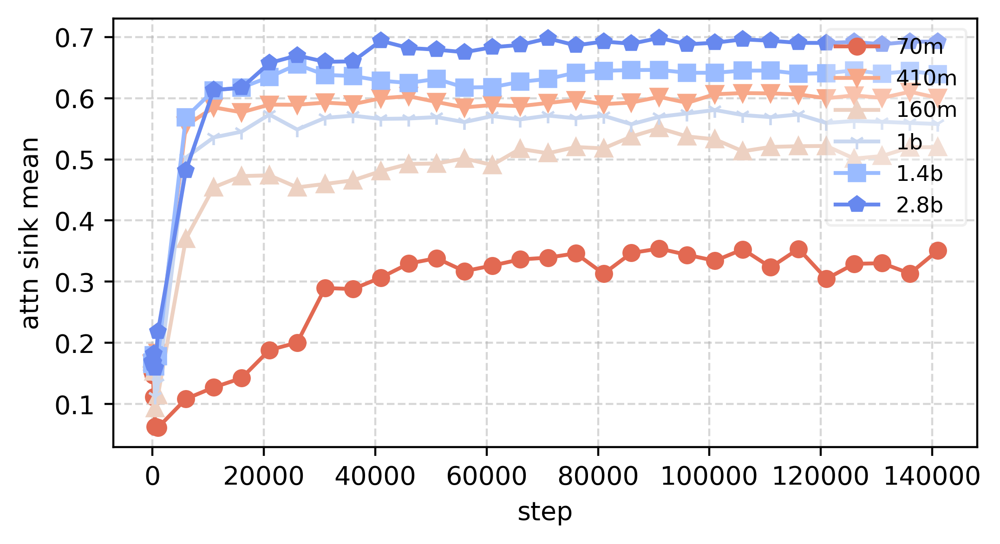

In [14]:
colors = sns.color_palette('coolwarm_r', len(attn_sink_dict.keys()))
marks = [ 'o','v','^','1','s','p','*','+','D', '>', '2', '4','p','h','_','<','w']
revisions = [0] + [int(2**i) for i in range(0, 10)]  + list(range(1000, 143000, 5000))
plt.figure(figsize=(6,3), dpi=400)
for i, key in enumerate(attn_sink_dict.keys()):
    plt.plot(revisions, attn_sink_dict[key], color=colors[i],  marker=marks[i],label=key)
    print(key, attn_sink_dict[key])
plt.grid(linestyle="--", alpha=0.5)
plt.legend(loc="upper right", framealpha=0.3, fontsize='small') 
plt.xlabel('step'),plt.ylabel('attn sink mean')

### BI score

In [18]:
bi_scores_dict = defaultdict(list)
# pythia
save_path_tmp = os.path.join(save_path, 'pythia')
if not os.path.exists(save_path_tmp): os.makedirs(save_path_tmp)
model_size_list = ['70m','160m', '410m','1b','1.4b','2.8b' ]  # ,'6.9b'
revisions = [0] + [int(2**i) for i in range(0, 10)]  + list(range(1000, 143000, 5000))
for model_size in model_size_list:
    model_name = f'EleutherAI/pythia-{model_size}'
    for revision in revisions:
        if os.path.exists(os.path.join(save_path_tmp,model_size, f'{revision}.dat')):
            data = load_data(os.path.join(save_path_tmp,model_size, f'{revision}.dat'))
            
            hidden_state = data['long'].hidden_states
            bi_scores = []
            for layer_id in range(hidden_state.shape[0]-1):
                bi_scores.append(BI_score(hidden_state[layer_id], hidden_state[layer_id+1]))
            bi_scores = np.concatenate(bi_scores, axis=-1)
            bi_scores = list(np.mean(bi_scores, axis=0))
            bi_scores_dict[model_size].append(bi_scores)
        else:
            print(f'No data for {model_name}, {revision}')

(40, 6)


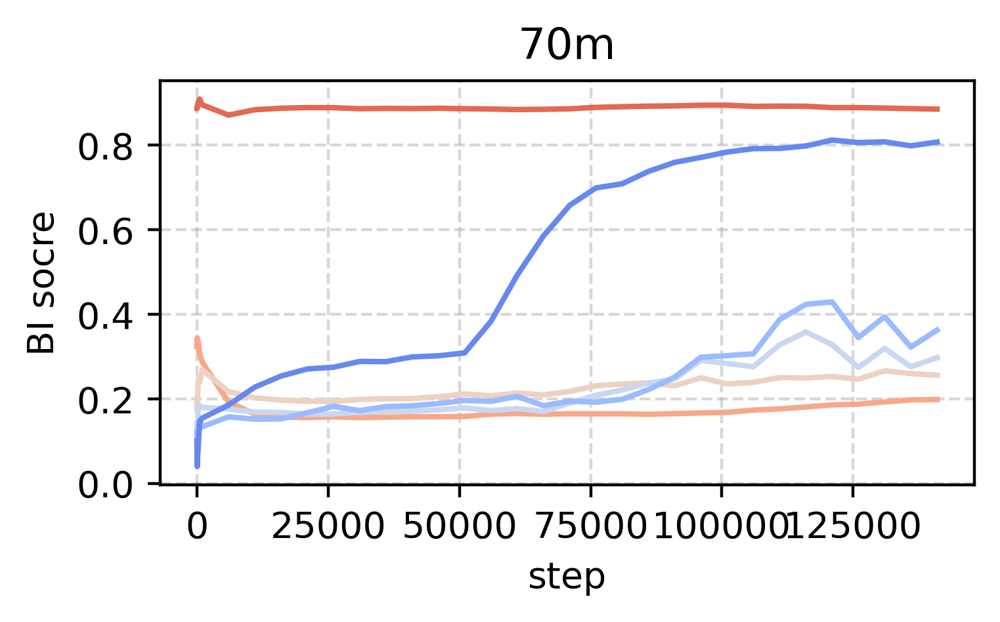

(40, 24)


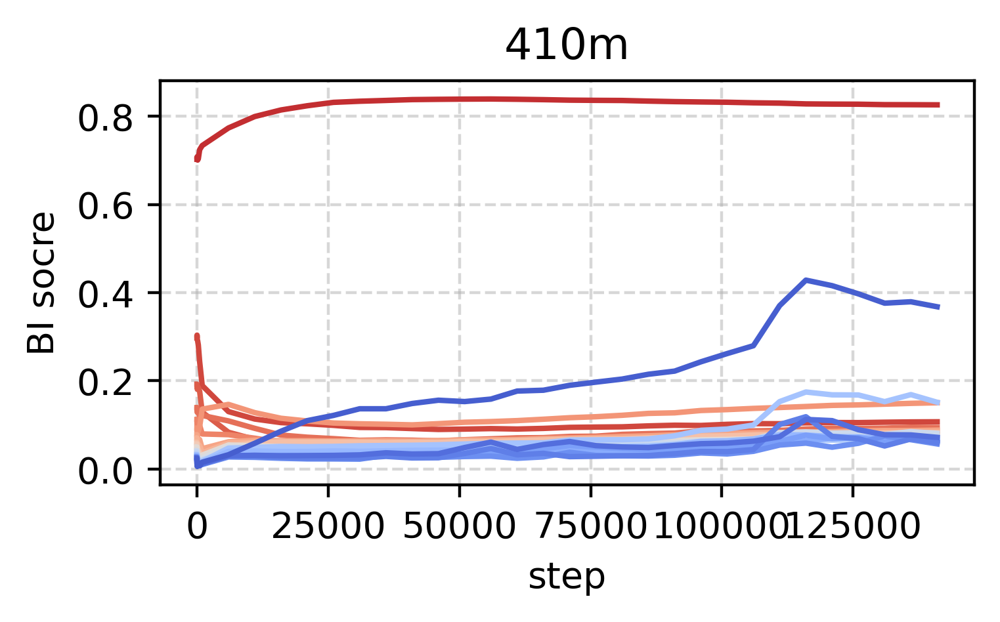

(40, 12)


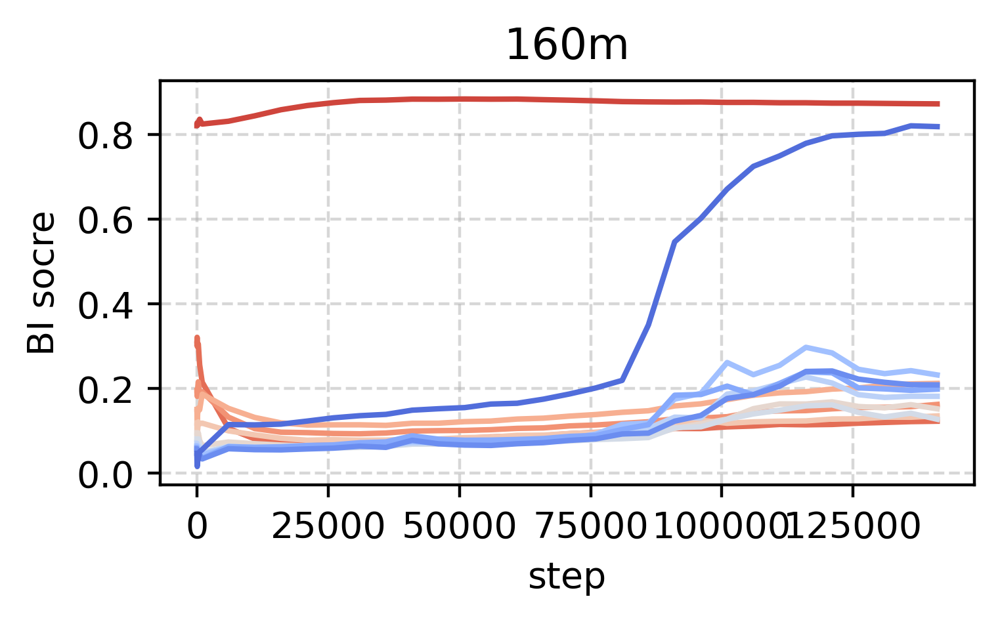

(40, 16)


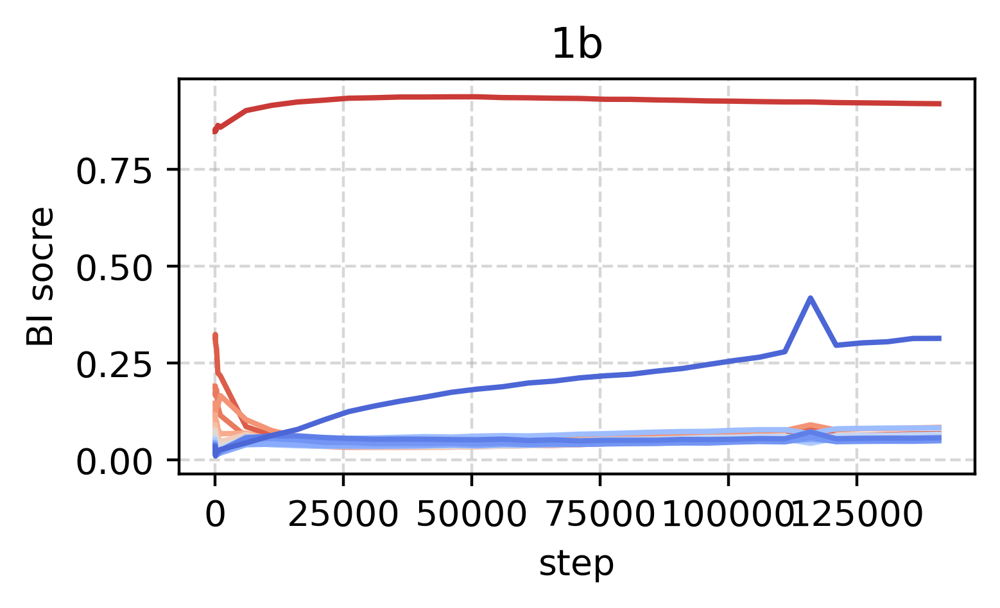

(40, 24)


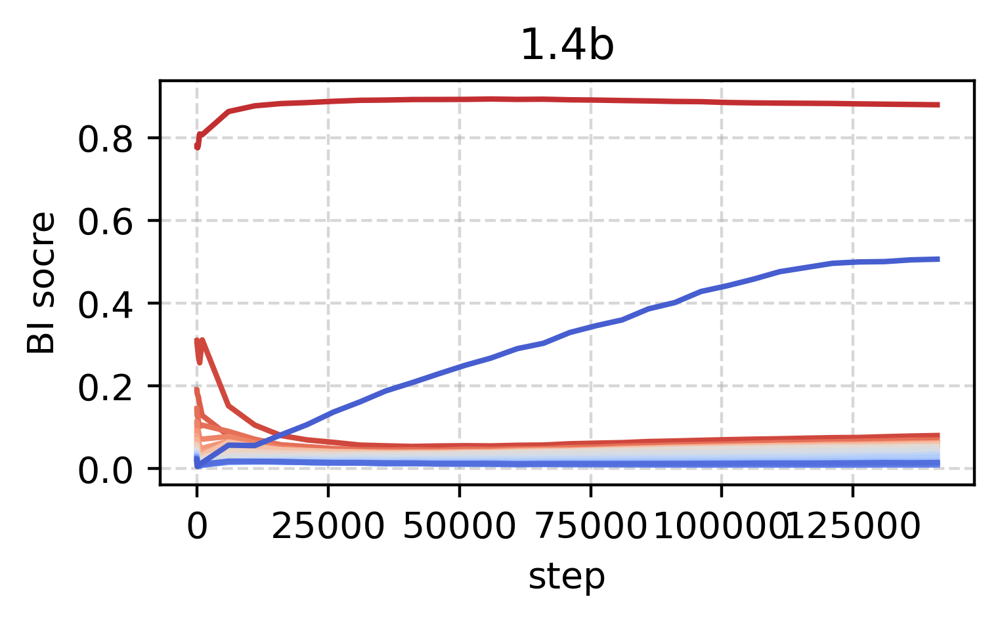

(40, 32)


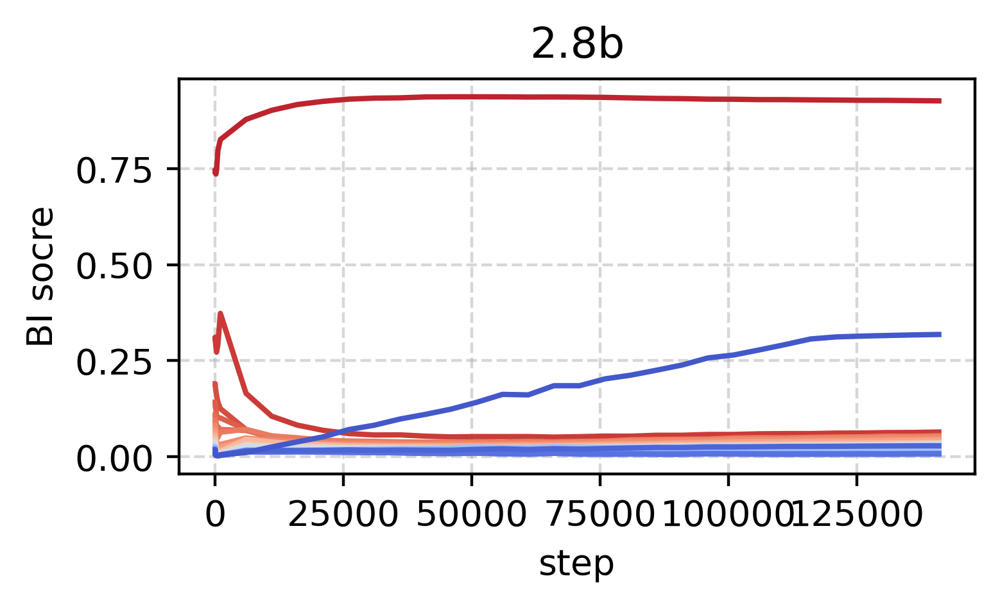

In [33]:
# marks = [ 'o','v','^','1','s','p','*','+','D', '>', '2', '4','p','h','_','<','w']
revisions = [0] + [int(2**i) for i in range(0, 10)]  + list(range(1000, 143000, 5000))
for model_size in bi_scores_dict.keys():
    bi_scores_list = np.array(bi_scores_dict[model_size])
    print(bi_scores_list.shape)
    colors = sns.color_palette('coolwarm_r', bi_scores_list.shape[1])
    plt.figure(figsize=(4,2), dpi=400)
    for layer_id in range(bi_scores_list.shape[1]):
        plt.plot(revisions, bi_scores_list[:,layer_id], color=colors[layer_id], label=f'{layer_id+1}')
    plt.grid(linestyle="--", alpha=0.5)
    # plt.legend(loc="upper right", framealpha=0.3, fontsize='small') 
    plt.xlabel('step'),plt.ylabel('BI socre')
    plt.title(model_size)
    plt.show()

In [17]:
models = ['meta-llama/Llama-2-7b-hf', 'meta-llama/Llama-2-7b-chat-hf',
        'meta-llama/Llama-2-13b-hf', 'meta-llama/Llama-2-13b-chat-hf',
        'Qwen/Qwen2-7B' , 'Qwen/Qwen2-7B-Instruct',
        'Qwen/Qwen2-1.5B', 'Qwen/Qwen2-1.5B-Instruct']
instruct_bi_scores_dict = dict()
save_path_tmp = save_path
for model_name in models:
    p = model_name.split('/')[1]
    if os.path.exists(os.path.join(save_path_tmp, f'{p}.dat')):
        data = load_data(os.path.join(save_path_tmp, f'{p}.dat'))
        hidden_state = data['long'].hidden_states
        bi_scores = []
        for layer_id in range(hidden_state.shape[0]-1):
            bi_scores.append(BI_score(hidden_state[layer_id], hidden_state[layer_id+1]))
        bi_scores = np.concatenate(bi_scores, axis=-1)
        bi_scores = list(np.mean(bi_scores, axis=0))
        instruct_bi_scores_dict[p]=bi_scores

(Text(0.5, 0, 'layer'), Text(0, 0.5, 'bi socre'))

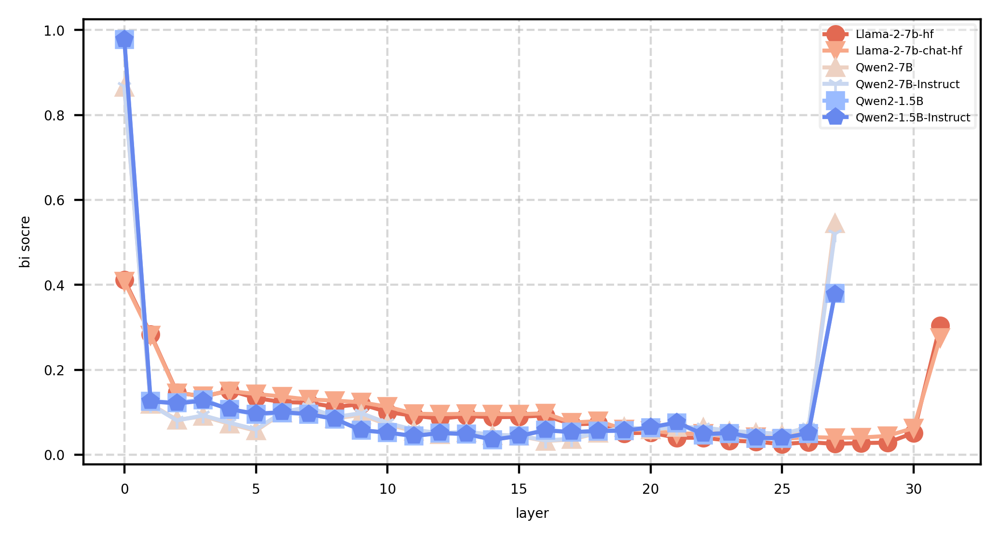

In [25]:
instruct_bi_scores_dict.keys(), len(instruct_bi_scores_dict['Llama-2-7b-hf'])
colors = sns.color_palette('coolwarm_r', len(instruct_bi_scores_dict.keys()))
marks = [ 'o','v','^','1','s','p','*','+','D', '>', '2', '4','p','h','_','<','w']
plt.figure(figsize=(6,3), dpi=400)
for i,key in enumerate(instruct_bi_scores_dict.keys()):
    bi_score = instruct_bi_scores_dict[key]
    plt.plot(range(len(bi_score)), bi_score, color=colors[i],  marker=marks[i], label=key)
plt.grid(linestyle="--", alpha=0.5)
plt.legend(loc="upper right", framealpha=0.3, fontsize='small') 
plt.xlabel('layer'),plt.ylabel('bi socre')

### key umap

In [44]:
def umap_keys(model_size):
    save_path_tmp = os.path.join(save_path, 'pythia')
    if not os.path.exists(save_path_tmp): os.makedirs(save_path_tmp)
    revisions = [0] + [int(2**i) for i in range(0, 10)]  + list(range(1000, 143000, 5000))
    model_name = f'EleutherAI/pythia-{model_size}'
    umap_keys_list = list()
    for revision in revisions:
        if os.path.exists(os.path.join(save_path_tmp,model_size, f'{revision}.dat')):
            data = load_data(os.path.join(save_path_tmp,model_size, f'{revision}.dat'))
            keys = data['long'].key
            original_keys = np.transpose(keys,(0,2,1,3)).reshape(keys.shape[0],keys.shape[2], -1)
            umap_keys = get_umap(original_keys.reshape(-1, original_keys.shape[-1]), 2) \
                                .reshape(original_keys.shape[0],original_keys.shape[1],-1)
            # print(umap_keys.shape)
            umap_keys_list.append(umap_keys)
        else:
            print(f'No data for {model_name}, {revision}')
    return umap_keys_list,revisions

def draw_umap(umap_keys_list,revisions):
    for step, umap_keys in enumerate(umap_keys_list):
        plt.subplots(figsize=(5,5), dpi=200)
        colors = sns.color_palette('coolwarm_r', umap_keys.shape[0])
        datalabel = [f'layer{i+1}' for i in range(umap_keys.shape[0])]
        for i, l in enumerate(datalabel):
            plt.scatter(umap_keys[i,:,0].reshape(-1), umap_keys[i,:,1].reshape(-1), color=colors[i],label=l, s=50)
        plt.grid(linestyle="--", alpha=0.3)
        # plt.xticks([]), plt.yticks([])
        if len(datalabel)<40 : 
            plt.legend(loc="upper right", framealpha=0.3,fontsize='small') 
        plt.title(f'step {revisions[step]}')

/Users/yangwang/anaconda3/envs/EE228HW/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:301: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
/Users/yangwang/anaconda3/envs/EE228HW/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:301: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
/Users/yangwang/anaconda3/envs/EE228HW/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:301: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
/Users/yangwang/anaconda3/envs/EE228HW/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:301: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
/Users/yangwang/anaconda3/envs/EE228HW/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:301: UserWarning: Gr

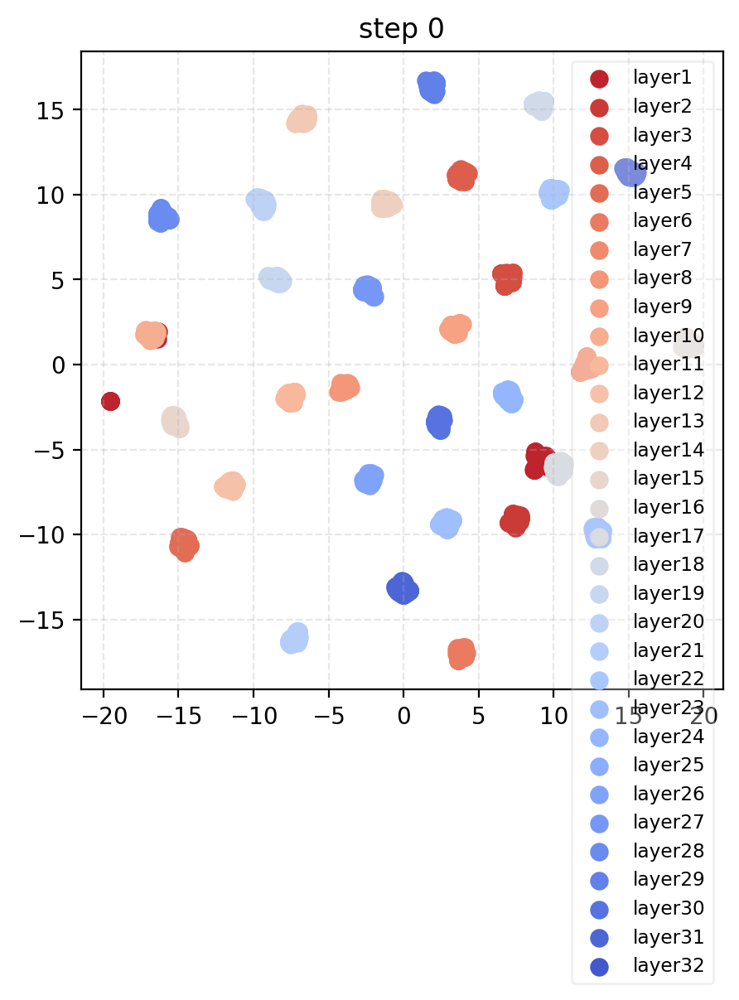

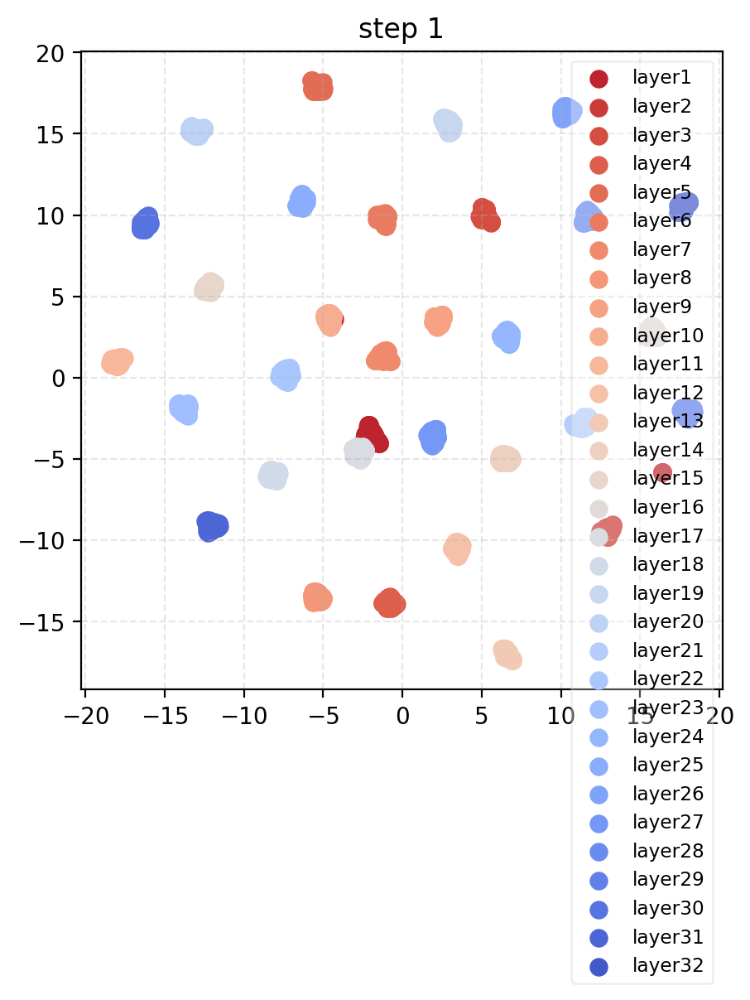

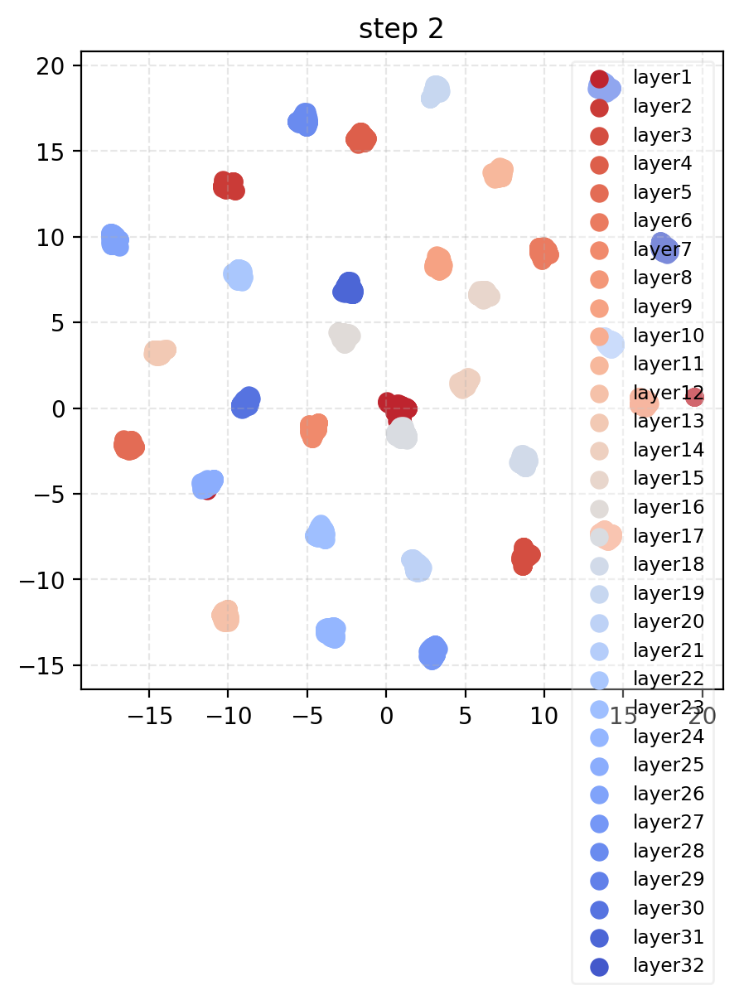

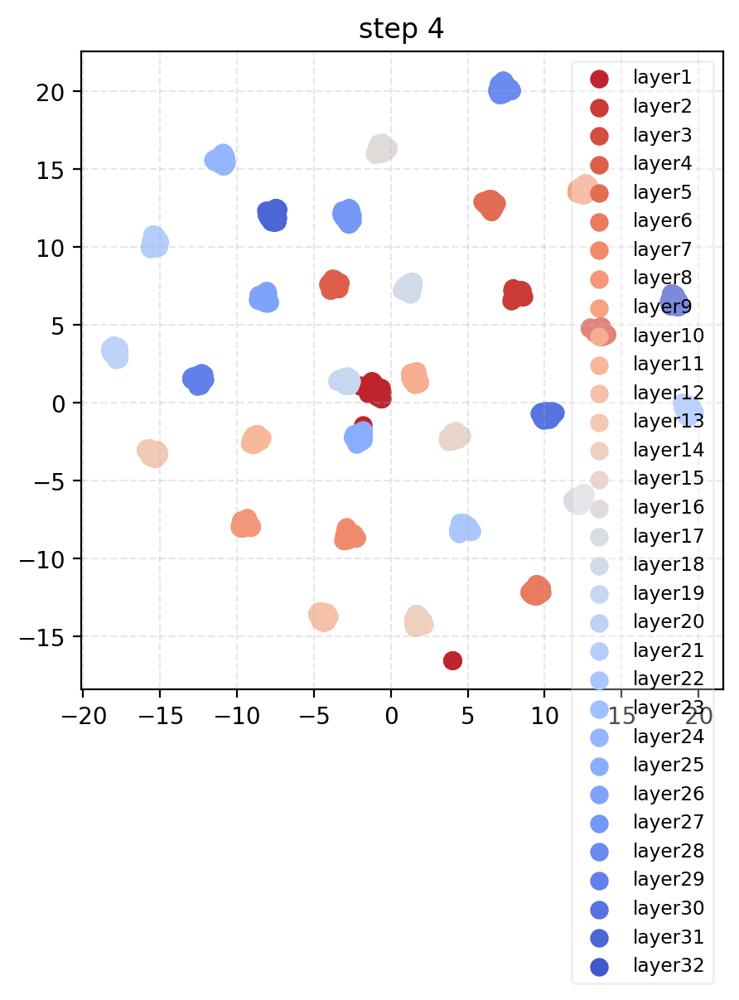

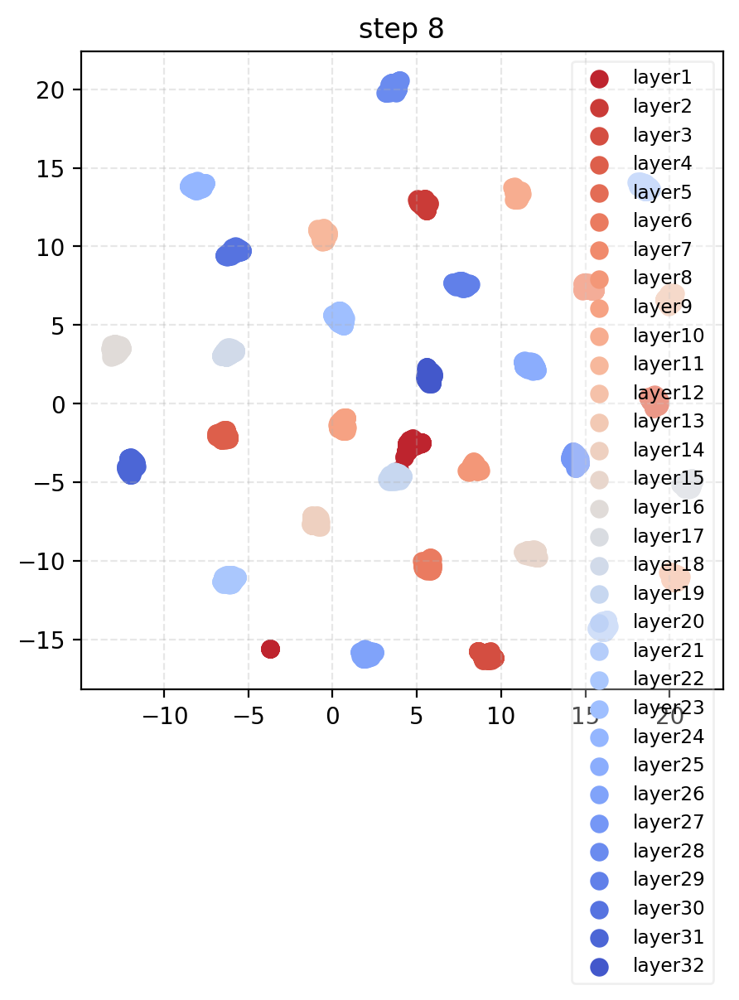

...

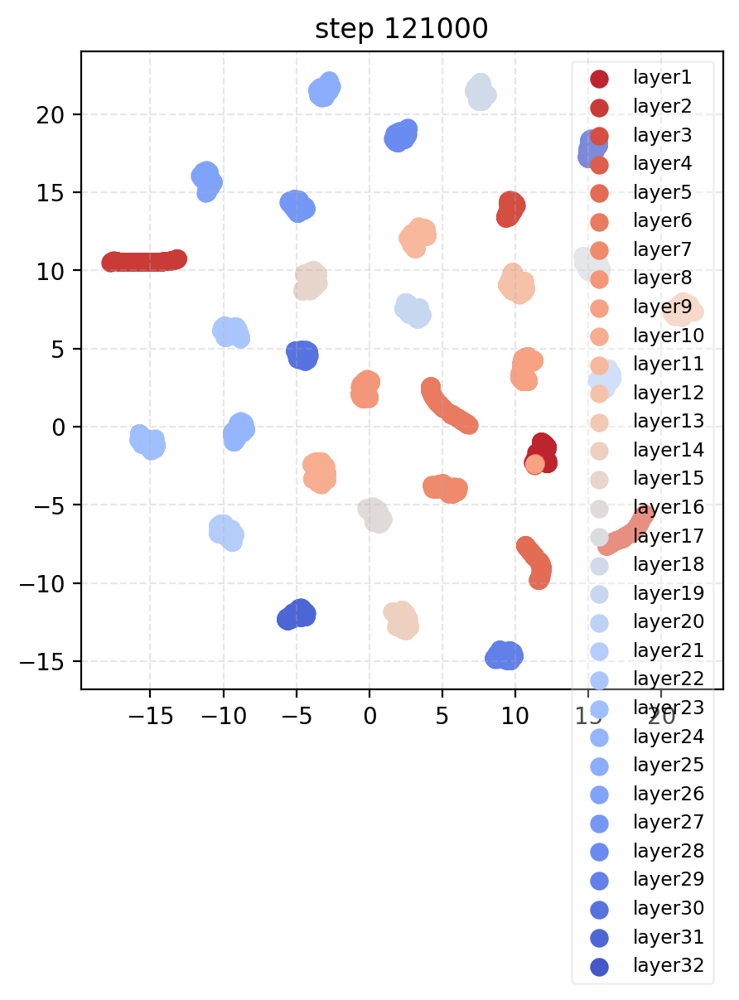

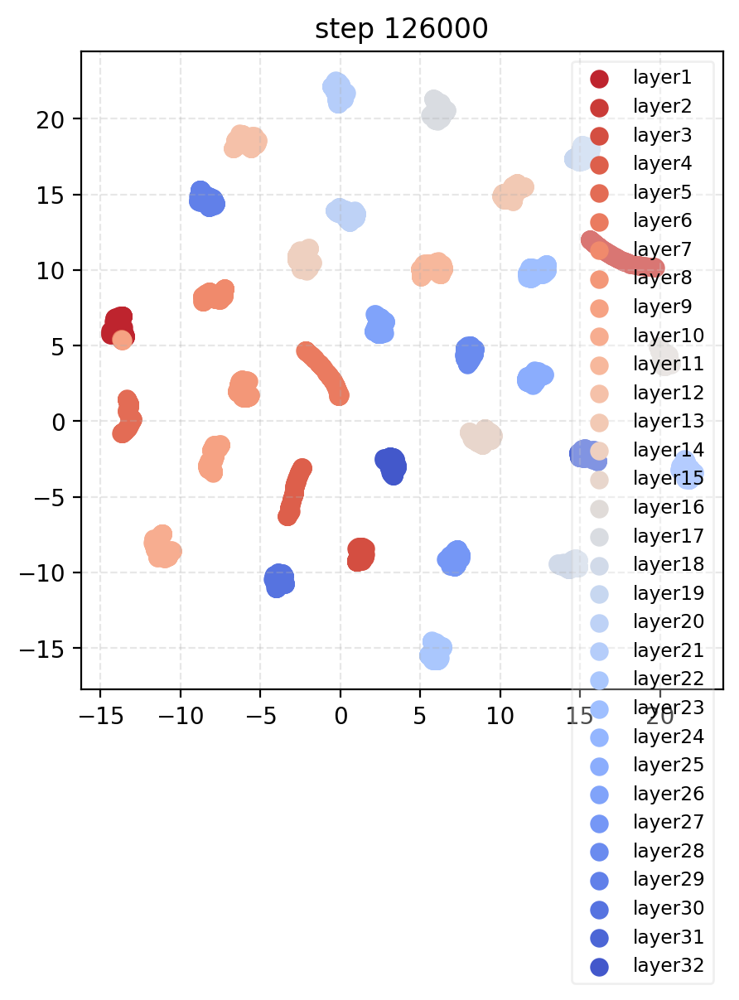

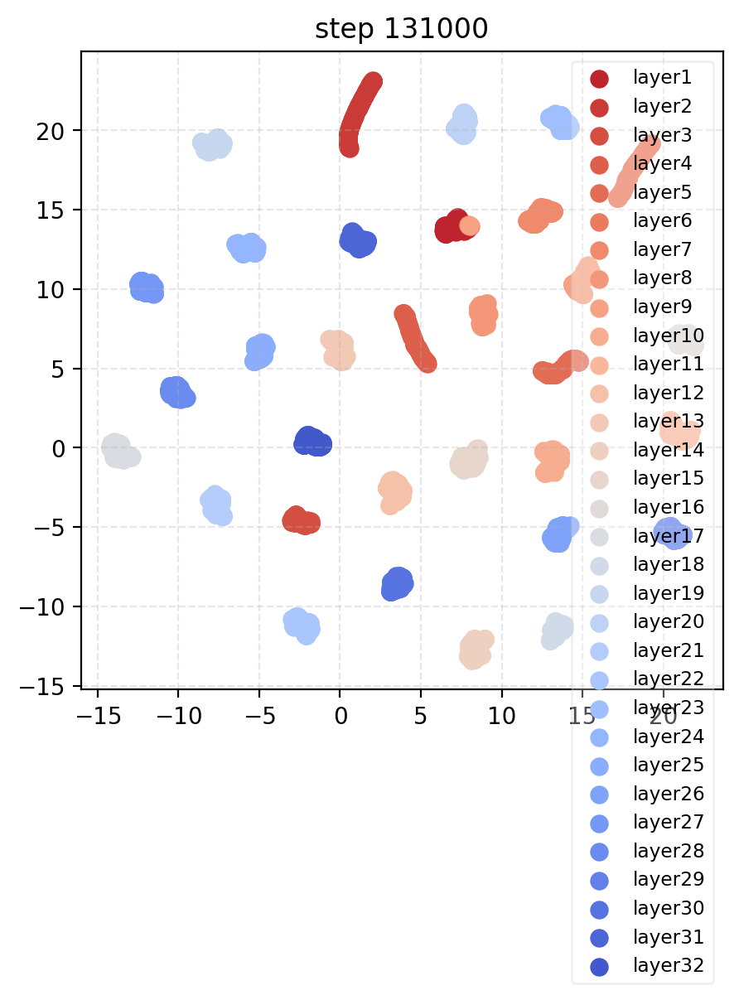

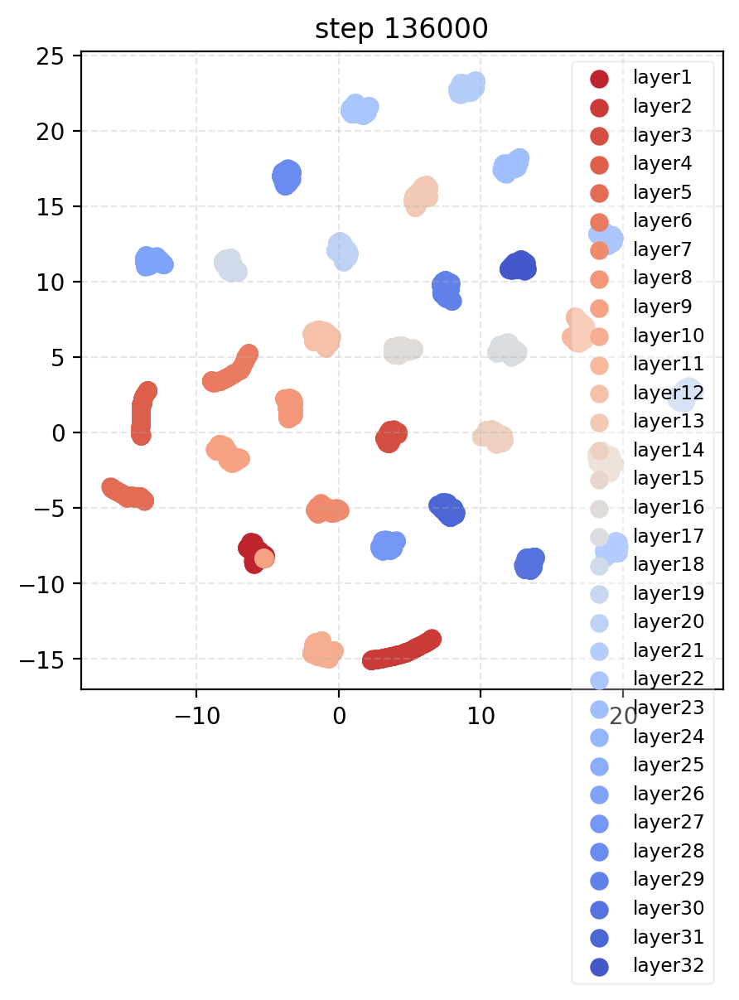

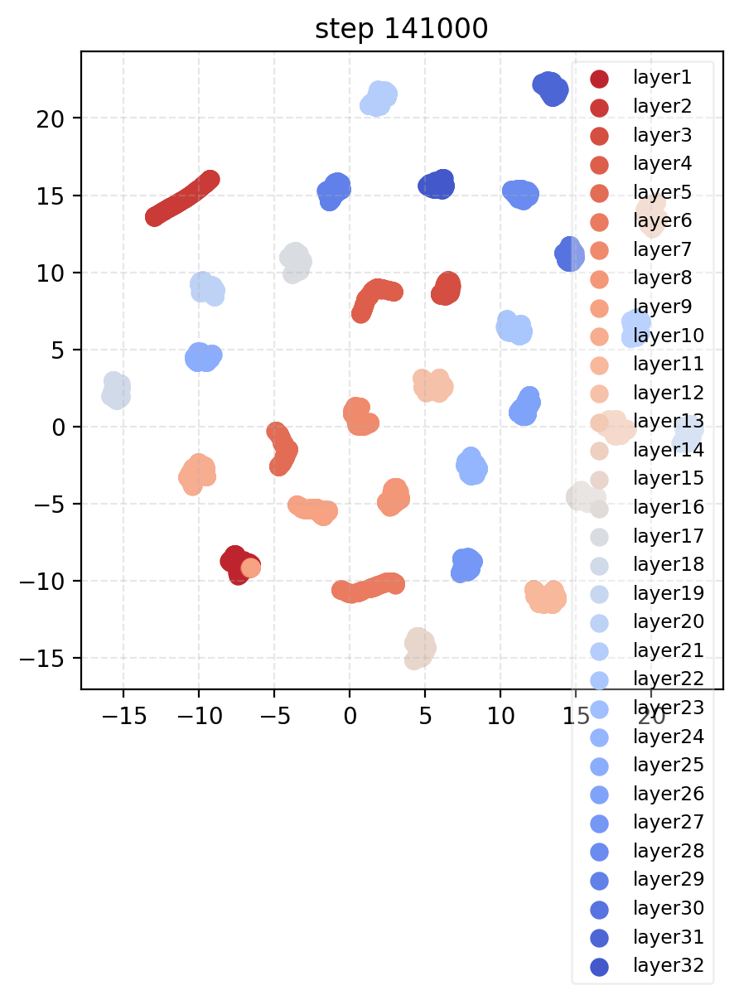

In [45]:
model_size_list = ['2.8b']  # ,'6.9b' , '70m','410m', '1.4b', '160m',, '1b' 
umap_keys_list,revisions = umap_keys('2.8b')
draw_umap(umap_keys_list,revisions)

In [13]:
models = ['meta-llama/Llama-2-7b-hf', 'meta-llama/Llama-2-7b-chat-hf',
        'meta-llama/Llama-2-13b-hf', 'meta-llama/Llama-2-13b-chat-hf',
        'Qwen/Qwen2-7B' , 'Qwen/Qwen2-7B-Instruct',
        'Qwen/Qwen2-1.5B', 'Qwen/Qwen2-1.5B-Instruct']
instruct_key_umap_dict = dict()
save_path_tmp = save_path
for model_name in models:
    p = model_name.split('/')[1]
    if os.path.exists(os.path.join(save_path_tmp, f'{p}.dat')):
        data = load_data(os.path.join(save_path_tmp, f'{p}.dat'))
        keys = data['long'].key
        original_keys = np.transpose(keys,(0,2,1,3)).reshape(keys.shape[0],keys.shape[2], -1)
        umap_keys = get_umap(original_keys.reshape(-1, original_keys.shape[-1]), 2) \
                                .reshape(original_keys.shape[0],original_keys.shape[1],-1)
        instruct_key_umap_dict[p] = umap_keys

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.
/Users/yangwang/anaconda3/envs/EE228HW/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:301: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
/Users/yangwang/anaconda3/envs/EE228HW/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:301: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
/Users/yangwang/anaconda3/envs/EE228HW/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:301: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
/Users/yangwang/anaconda3/envs/EE228HW/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:301: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
/Users/yangwang/anaconda3/envs/

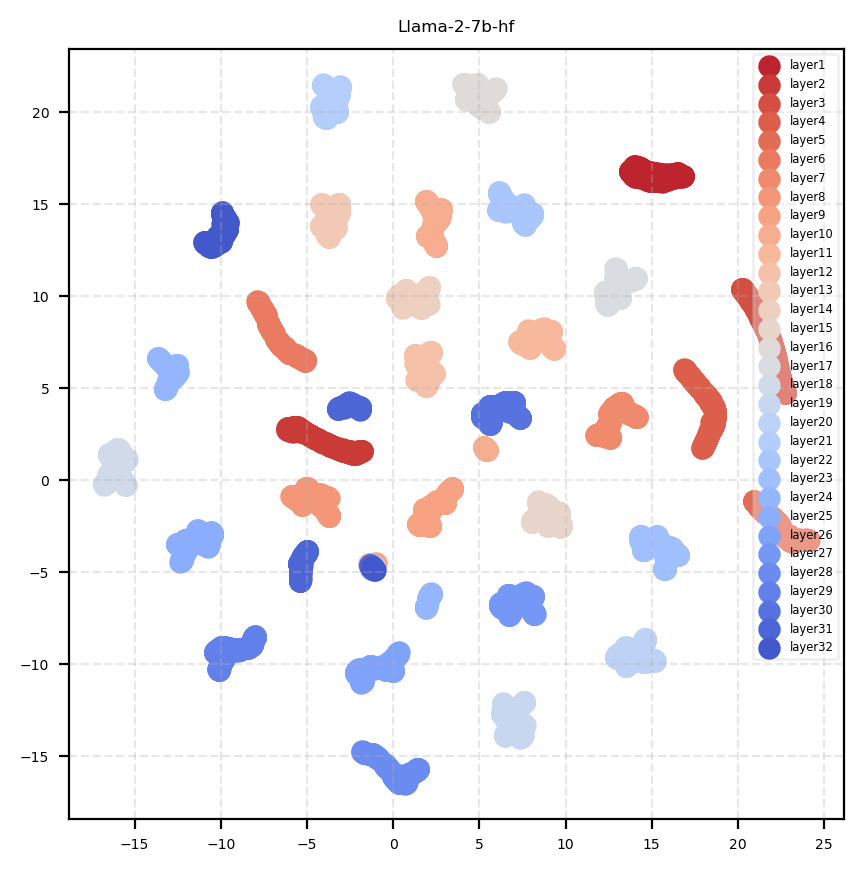

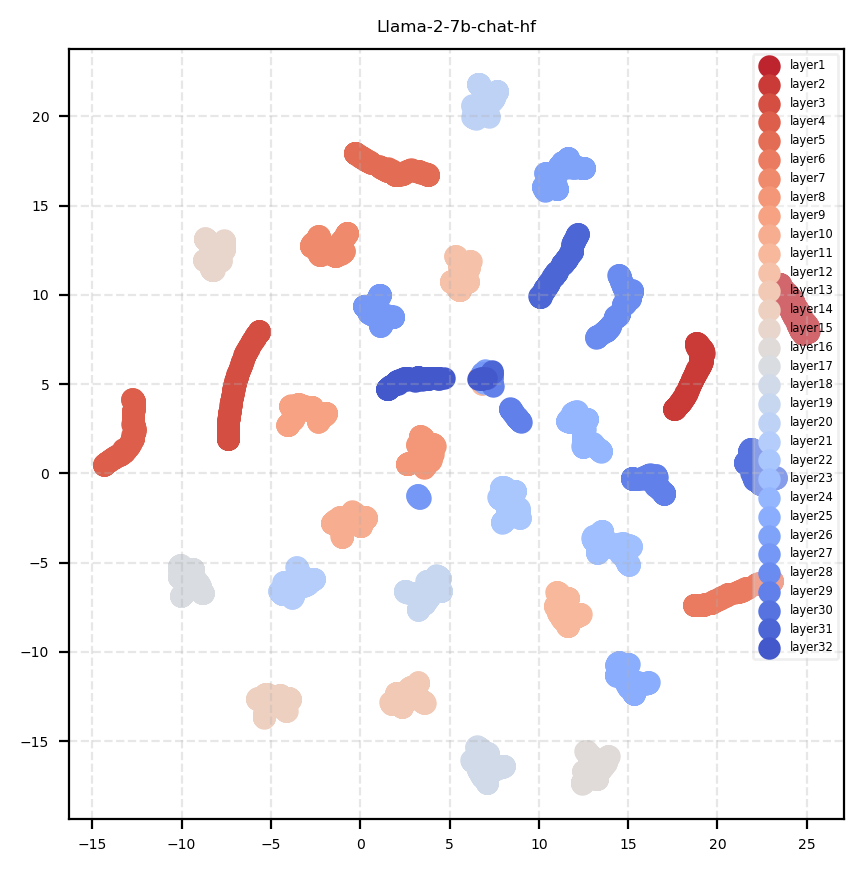

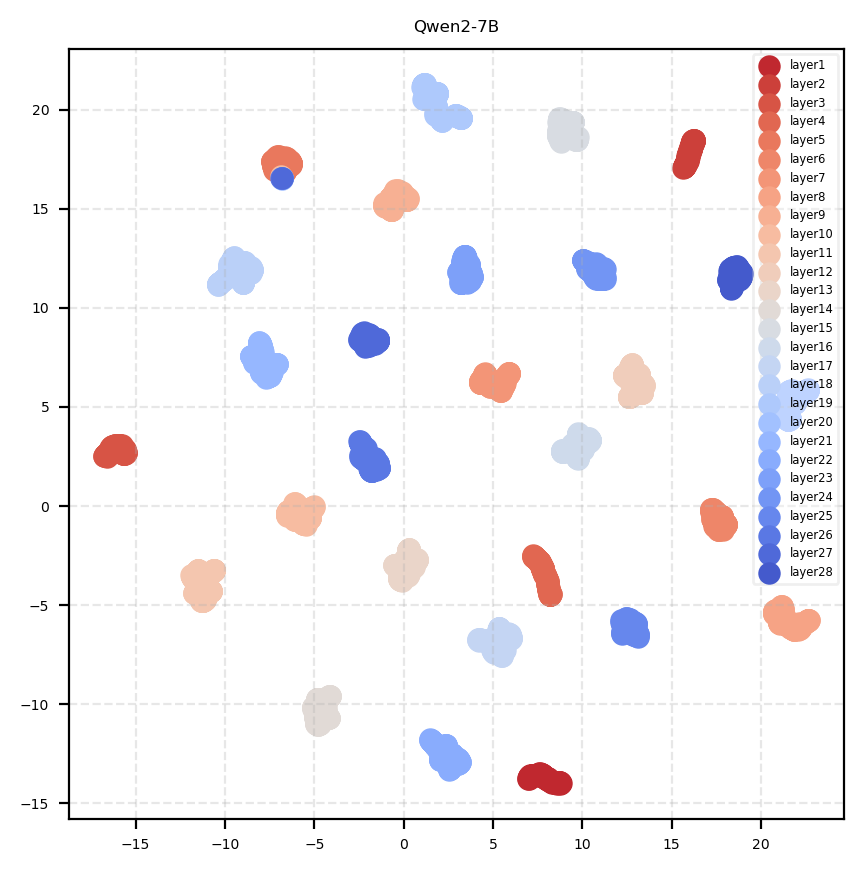

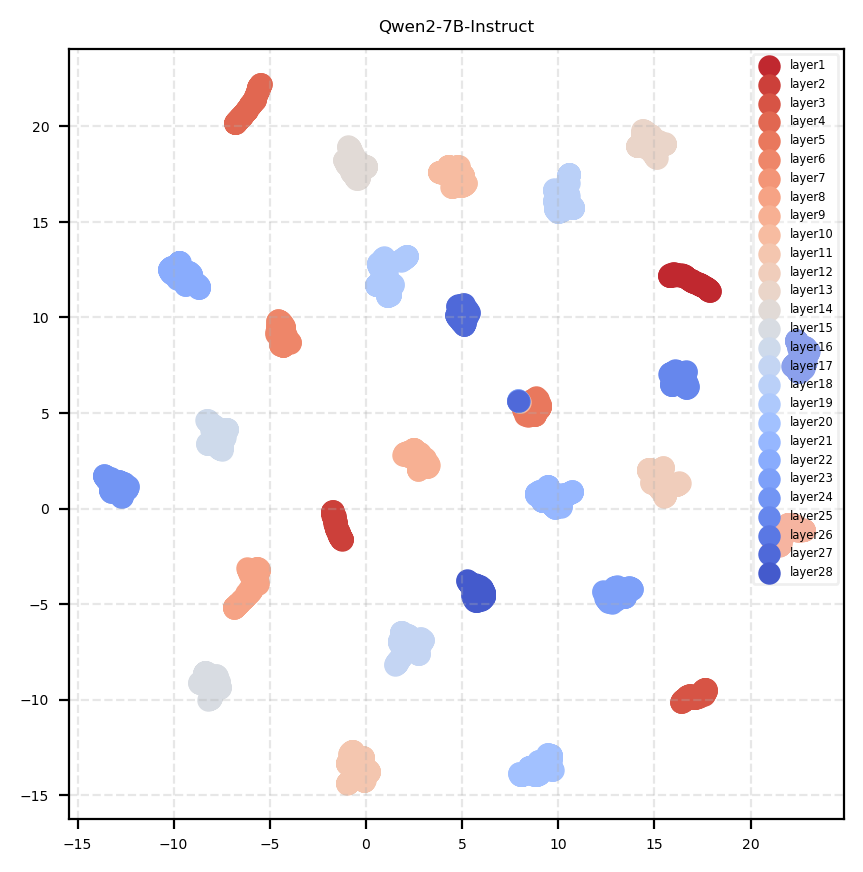

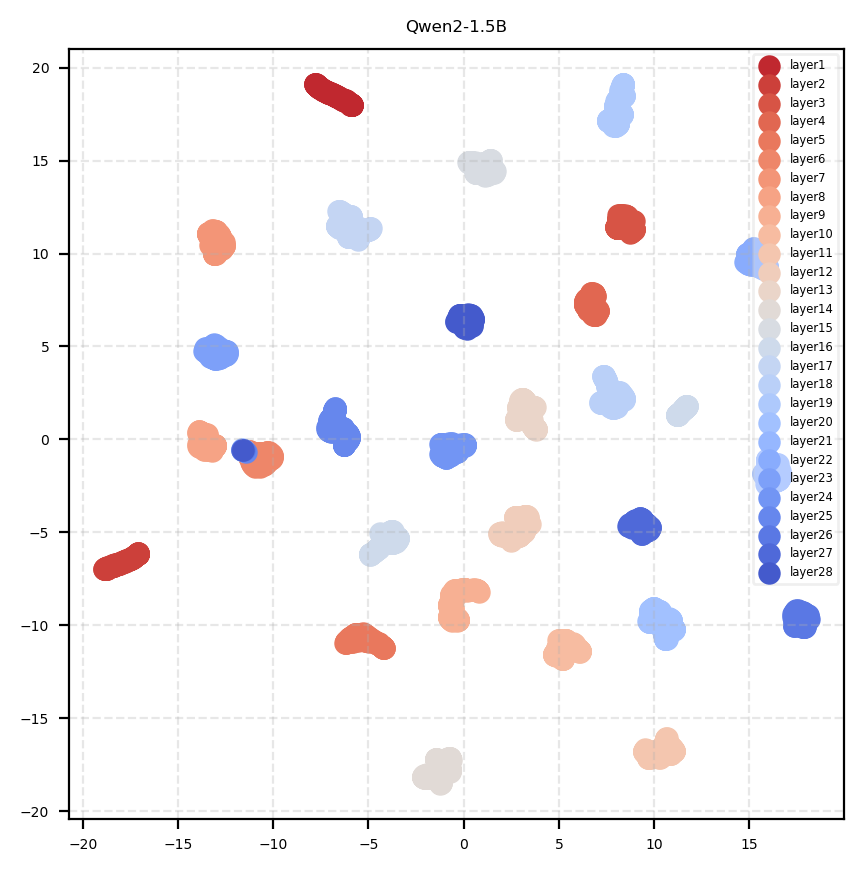

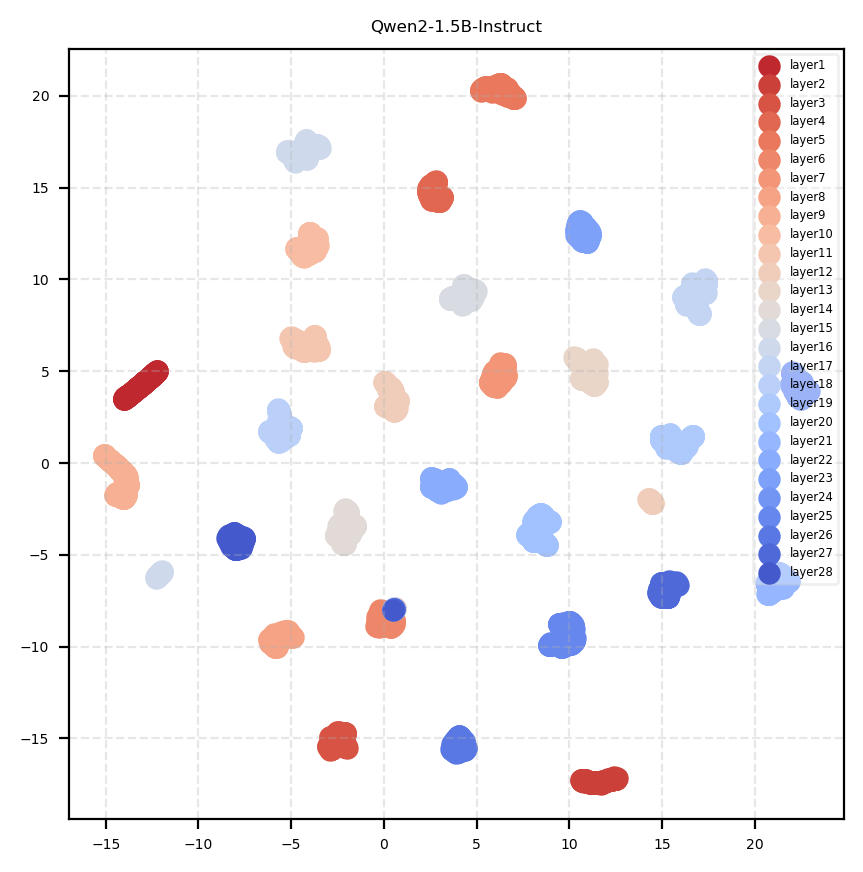

In [14]:
instruct_key_umap_dict.keys(), instruct_key_umap_dict['Llama-2-7b-hf'].shape
for step, key in enumerate(instruct_key_umap_dict.keys()):
    umap_keys = instruct_key_umap_dict[key]
    plt.subplots(figsize=(5,5), dpi=200)
    colors = sns.color_palette('coolwarm_r', umap_keys.shape[0])
    datalabel = [f'layer{i+1}' for i in range(umap_keys.shape[0])]
    for i, l in enumerate(datalabel):
        plt.scatter(umap_keys[i,:,0].reshape(-1), umap_keys[i,:,1].reshape(-1), color=colors[i],label=l, s=50)
    plt.grid(linestyle="--", alpha=0.3)
    # plt.xticks([]), plt.yticks([])
    if len(datalabel)<40 : 
        plt.legend(loc="upper right", framealpha=0.3,fontsize='small') 
    plt.title(f'{key}')
    plt.show()

### key similarity

In [9]:
# pythia 
def get_similarity_list(model_size, layer_id, head_id , revisions):
    save_path_tmp = os.path.join(save_path, 'pythia')
    if not os.path.exists(save_path_tmp): os.makedirs(save_path_tmp)
    model_name = f'EleutherAI/pythia-{model_size}'
    similairty_list = []
    for revision in revisions:
        if os.path.exists(os.path.join(save_path_tmp, model_size, f'{revision}.dat')):
            data = load_data(os.path.join(save_path_tmp, model_size, f'{revision}.dat'))
            keys = data['long'].key
            key_list = []
            for layer in range(keys.shape[0]):
                key_simi_list = []
                for head in range(keys.shape[1]):
                    key_simi = cosine_similarity_matrix(keys[layer, head], keys[layer, head])
                    key_simi_list.append(key_simi.reshape(-1, key_simi.shape[0], key_simi.shape[1]))
                key_simi_list = np.concatenate(key_simi_list, axis=0)
                key_list.append(key_simi_list.reshape([-1]+list(key_simi_list.shape)))
            key_list = np.concatenate(key_list, axis=0)
            similairty = key_list[layer_id, head_id]
            similairty_list.append(similairty)
        else:
            print(f'No data for {model_name}, {revision}')
    return similairty_list

def draw_heatmap(similairty_list,revisions):
    for step, similairty in enumerate(similairty_list):
        plt.subplots(figsize=(4,4), dpi=200)
        plt.rcParams['font.size'] = '5'
        cmap = sns.color_palette('coolwarm', as_cmap=True) # "Reds"
        sns.heatmap(similairty, cmap=cmap)
        plt.title(f'step {revisions[step]}')
        plt.show()

In [1]:
layer_id, head_id = 22, 26
model_size = '2.8b'  # ,'6.9b' '1b', '70m','410m', '1.4b', '160m',
revisions = [0] + [int(2**i) for i in range(0, 10)]  + list(range(1000, 143000, 5000))
similairty_list = get_similarity_list(model_size, layer_id, head_id , revisions)
draw_heatmap(similairty_list,revisions)      

NameError: name 'get_similarity_list' is not defined

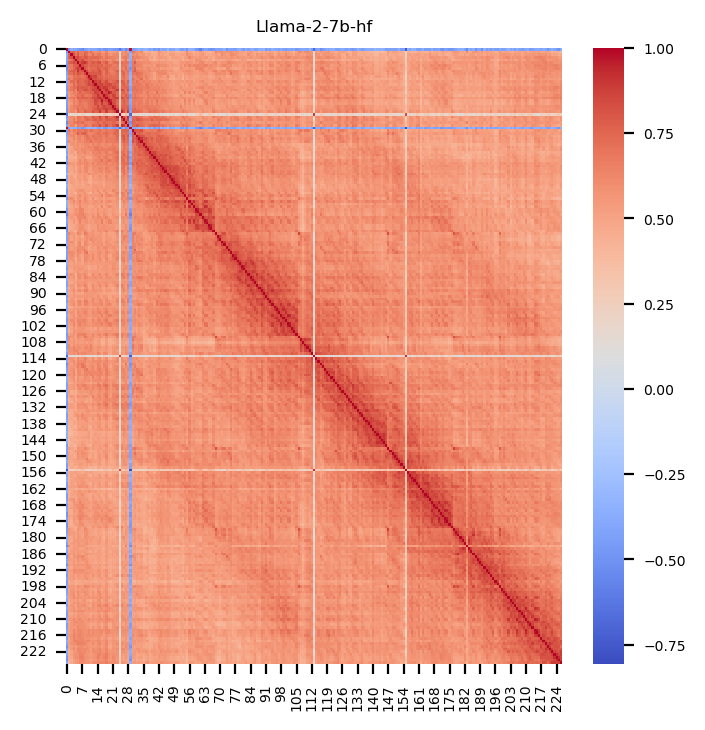

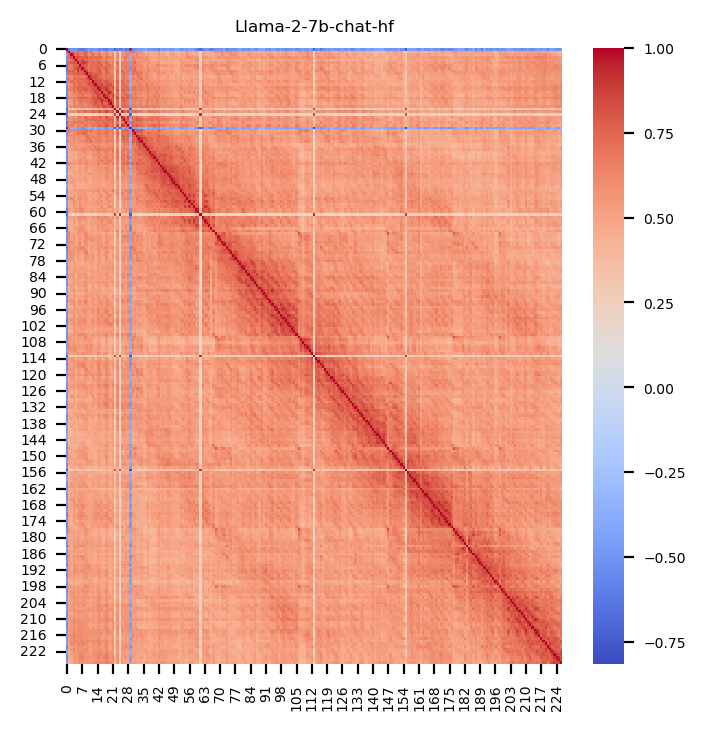

In [11]:
layer_id, head_id = 22, 26
models = ['meta-llama/Llama-2-7b-hf', 'meta-llama/Llama-2-7b-chat-hf',
        # 'meta-llama/Llama-2-13b-hf', 'meta-llama/Llama-2-13b-chat-hf',
        # 'Qwen/Qwen2-7B' , 'Qwen/Qwen2-7B-Instruct',
        # 'Qwen/Qwen2-1.5B', 'Qwen/Qwen2-1.5B-Instruct'
        ]
instruct_key_simi_dict = dict()
save_path_tmp = save_path
for model_name in models:
    p = model_name.split('/')[1]
    if os.path.exists(os.path.join(save_path_tmp, f'{p}.dat')):
        data = load_data(os.path.join(save_path_tmp, f'{p}.dat'))
        keys = data['long'].key
        key_simi = cosine_similarity_matrix(keys[layer_id, head_id], keys[layer_id, head_id])
        instruct_key_simi_dict[p] = key_simi

for step, key in enumerate(instruct_key_simi_dict.keys()):
    similairty = instruct_key_simi_dict[key]
    plt.subplots(figsize=(4,4), dpi=200)
    plt.rcParams['font.size'] = '5'
    cmap = sns.color_palette('coolwarm', as_cmap=True) # "Reds"
    sns.heatmap(similairty, cmap=cmap)
    plt.title(f'{key}')
    plt.show()